<a href="https://colab.research.google.com/github/Shailvi-Thapliyal/skills-introduction-to-gith1ub/blob/main/C06P02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Read the dataset and display some information about the dataset

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import metrics
!pip install imblearn
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
!pip install mlxtend
from sklearn.linear_model import LogisticRegression
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt
from sklearn.metrics import recall_score
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

In [ ]:
df = pd.read_csv("bank_loan_defaulter.csv")

In [ ]:
df.sample(5)

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
3249,39827082,29198,5260,32641.654690,59,BAT2252229,20.029542,C,D2,MORTGAGE,...,5.419523,0.030804,0,INDIVIDUAL,107,0,21,132358,15588,0
46407,8406335,11747,20119,5093.392248,59,BAT3873588,13.510702,C,C5,RENT,...,2.576661,0.340321,0,INDIVIDUAL,40,0,1876,165934,31214,0
22951,5439032,14241,22547,21125.561360,58,BAT2136391,16.556379,E,B3,RENT,...,1.523106,0.052083,0,INDIVIDUAL,73,0,37,135659,21536,0
26169,51228966,15728,27069,9238.462728,59,BAT1104812,10.102710,G,D1,MORTGAGE,...,7.116332,0.530139,0,INDIVIDUAL,90,0,18,27653,23819,0
60694,36824212,15554,21226,11696.242590,59,BAT1184694,13.685528,A,B4,RENT,...,5.589055,0.136520,0,INDIVIDUAL,57,0,33,286654,4842,0


In [ ]:
df.shape

(67463, 35)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            67463 non-null  int64  
 1   Loan Amount                   67463 non-null  int64  
 2   Funded Amount                 67463 non-null  int64  
 3   Funded Amount Investor        67463 non-null  float64
 4   Term                          67463 non-null  int64  
 5   Batch Enrolled                67463 non-null  object 
 6   Interest Rate                 67463 non-null  float64
 7   Grade                         67463 non-null  object 
 8   Sub Grade                     67463 non-null  object 
 9   Employment Duration           67463 non-null  object 
 10  Home Ownership                67463 non-null  float64
 11  Verification Status           67463 non-null  object 
 12  Payment Plan                  67463 non-null  object 
 13  L

There are 67463 rows and 35 features.
There are 9 float type columns, 17 integer type columns and 9 object type columns.
there are no missing values.

# 2. Data cleansing and Exploratory data analysis

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isna().sum()

ID                              0
Loan Amount                     0
Funded Amount                   0
Funded Amount Investor          0
Term                            0
Batch Enrolled                  0
Interest Rate                   0
Grade                           0
Sub Grade                       0
Employment Duration             0
Home Ownership                  0
Verification Status             0
Payment Plan                    0
Loan Title                      0
Debit to Income                 0
Delinquency - two years         0
Inquires - six months           0
Open Account                    0
Public Record                   0
Revolving Balance               0
Revolving Utilities             0
Total Accounts                  0
Initial List Status             0
Total Received Interest         0
Total Received Late Fee         0
Recoveries                      0
Collection Recovery Fee         0
Collection 12 months Medical    0
Application Type                0
Last week Pay 

In [ ]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ID,67463.0,NaN,NaN,NaN,25627607.746498,21091554.023733,1297933.0,6570288.0,17915646.0,42715208.5,72245779.0
Loan Amount,67463.0,NaN,NaN,NaN,16848.902776,8367.865726,1014.0,10012.0,16073.0,22106.0,35000.0
Funded Amount,67463.0,NaN,NaN,NaN,15770.599114,8150.992662,1014.0,9266.5,13042.0,21793.0,34999.0
Funded Amount Investor,67463.0,NaN,NaN,NaN,14621.799323,6785.34517,1114.590204,9831.684984,12793.68217,17807.59412,34999.74643
Term,67463.0,NaN,NaN,NaN,58.173814,3.327441,36.0,58.0,59.0,59.0,59.0
Batch Enrolled,67463,41,BAT3873588,3626,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Interest Rate,67463.0,NaN,NaN,NaN,11.846258,3.718629,5.320006,9.297147,11.377696,14.193533,27.182348
Grade,67463,7,C,19085,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sub Grade,67463,35,B4,4462,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Employment Duration,67463,3,MORTGAGE,36351,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
##the data is skewed for a lot of features
##loan status values need to be coded into binary
#home ownership float type, which is not appropriate
#7 grades and 35 subgrades top being C and B4
#There are 41 batches enrolled with BAT3873588 batch with the most customers.
#Data,debit to income for term is skewed
#revolving balance,recoveries,total collection amount probably has outliers
#more of the applications are in waiting period
#more of the applications are of individual type
#accounts deliquent has either all 0 values by mistake or there are no accounts deliquent so we can drop this feature

id,batch enrolled, grade, loan title, inquiries, open accounts, public record, revolving balancee, revolving utilities, application type,

In [ ]:
df.head(50)

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.362860,59,BAT2522922,11.135007,B,C4,MORTGAGE,...,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.996920,59,BAT1586599,12.237563,C,D3,RENT,...,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.224550,59,BAT2136391,12.545884,F,D4,MORTGAGE,...,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.155850,59,BAT2428731,16.731201,C,C3,MORTGAGE,...,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.926670,59,BAT5341619,15.008300,C,D4,MORTGAGE,...,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0
5,50509046,34631,30203,8635.931613,36,BAT4694572,17.246986,B,G5,RENT,...,5.043575,0.581688,0,INDIVIDUAL,32,0,42,51252,27480,0
6,32737431,30844,19773,15777.511830,59,BAT4808022,10.731432,C,C5,RENT,...,3.167937,0.553076,0,INDIVIDUAL,71,0,3388,42069,31068,0
7,63151650,20744,10609,7645.014802,58,BAT2558388,13.993688,A,A5,OWN,...,0.098448,0.047589,0,INDIVIDUAL,87,0,48,184909,43303,0
8,4279662,9299,11238,13429.456610,59,BAT5341619,11.178457,G,C2,MORTGAGE,...,0.530214,0.216985,0,INDIVIDUAL,144,0,26,68126,7482,0
9,4431034,19232,8962,7004.097481,58,BAT2078974,5.520413,C,B5,RENT,...,2.912215,0.886864,0,INDIVIDUAL,9,0,35,71650,14871,0


In [ ]:
dff = df.drop(['ID', 'Batch Enrolled','Grade', 'Inquires - six months','Loan Title', 'Public Record', 'Revolving Balance', 'Revolving Utilities', 'Application Type', 'Open Account'], axis =1)

In [ ]:
dff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Loan Amount                   67463 non-null  int64  
 1   Funded Amount                 67463 non-null  int64  
 2   Funded Amount Investor        67463 non-null  float64
 3   Term                          67463 non-null  int64  
 4   Interest Rate                 67463 non-null  float64
 5   Sub Grade                     67463 non-null  object 
 6   Employment Duration           67463 non-null  object 
 7   Home Ownership                67463 non-null  float64
 8   Verification Status           67463 non-null  object 
 9   Payment Plan                  67463 non-null  object 
 10  Debit to Income               67463 non-null  float64
 11  Delinquency - two years       67463 non-null  int64  
 12  Total Accounts                67463 non-null  int64  
 13  I

<AxesSubplot:xlabel='Loan Status', ylabel='count'>

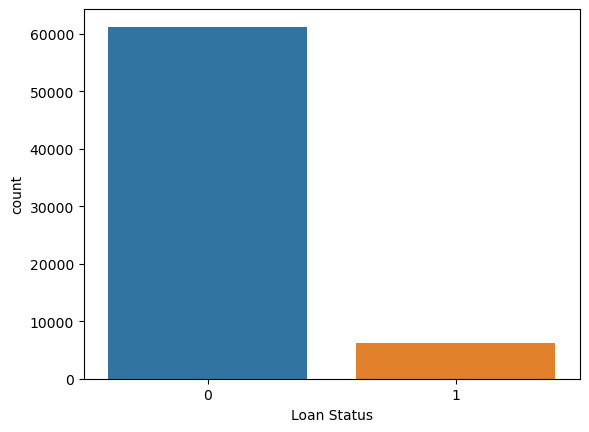

In [ ]:
sns.countplot(x=dff['Loan Status'])

In [ ]:
#as we can see data is highly unbalanced

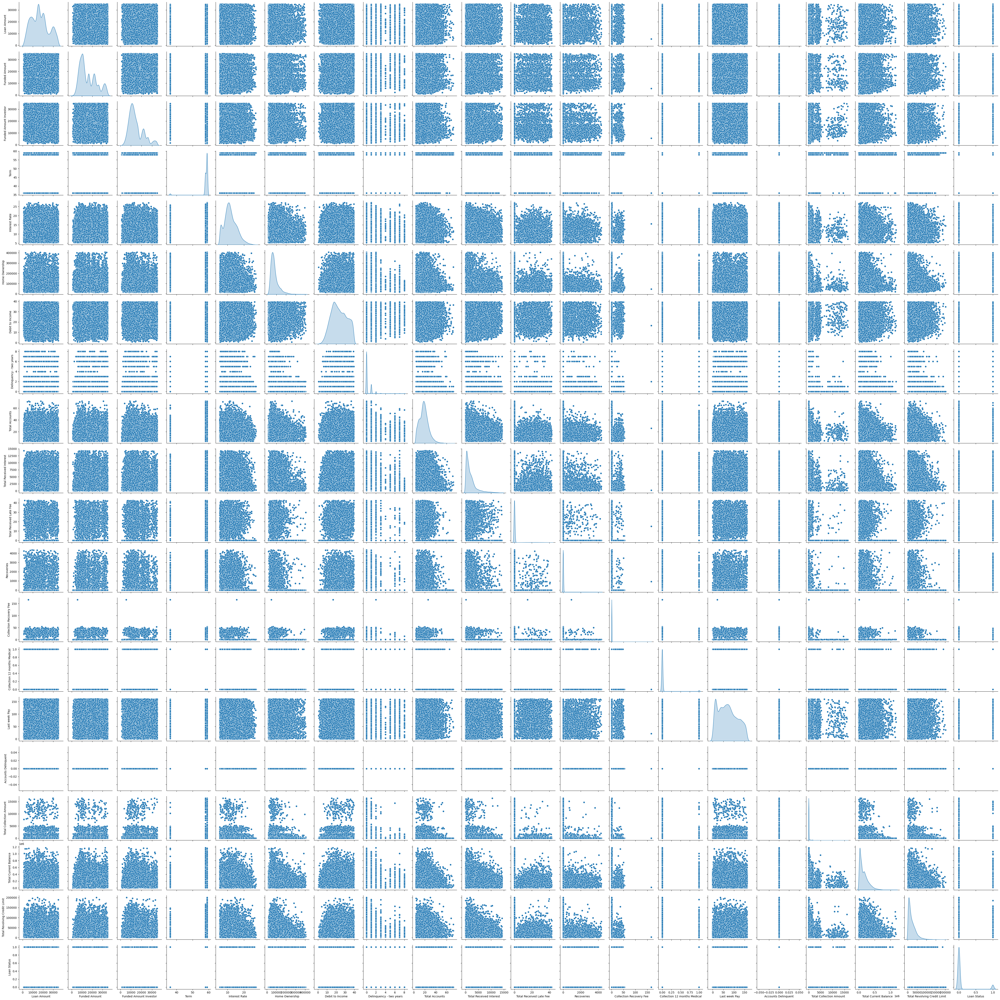

In [ ]:
sns.pairplot(dff, diag_kind='kde')

1. Many features have multiple gausians.
2. Terms, Home ownership, Total collection amount are highly skewed.
3. Interest rate, open, total accounts, total recieved interest, total current balance, total revolving credit limit are a moderately skewed.
4. Total received late fee, recoveries, collection recovery fee, collection 12 month medical have very sharp plots.
5. Loan status is highly unbalanced.
6. Interest rate vs Home ownership, total accounts, total current balance, Total revolving credit limit has a faint positive linear relationship.
7. Interest rate vs debit to income, delinquency two year has a faint negative linear relationship.
8. Home ownership vs total revolving credit limit, total current balance, total recieved interest total accounts have faint positive relation.
9. Home owenership vs debit to income has a faint negative relation.
10. Inquries six months vs total collection amount has a faint negative relation.
11. Total received vs total revolving credit has a faint positive relation.
12. Total current balance vs total revolving credit limit has a faint positive relation.


# 3. Data preparation for model building

In [ ]:
X = dff.drop(["Loan Status"], axis=1)
y = dff['Loan Status']

In [ ]:
for feature in X.columns:
    if X[feature].dtype == 'object':
        X[feature] = pd.Categorical(X[feature]).codes

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Loan Amount                   67463 non-null  int64  
 1   Funded Amount                 67463 non-null  int64  
 2   Funded Amount Investor        67463 non-null  float64
 3   Term                          67463 non-null  int64  
 4   Interest Rate                 67463 non-null  float64
 5   Sub Grade                     67463 non-null  int8   
 6   Employment Duration           67463 non-null  int8   
 7   Home Ownership                67463 non-null  float64
 8   Verification Status           67463 non-null  int8   
 9   Payment Plan                  67463 non-null  int8   
 10  Debit to Income               67463 non-null  float64
 11  Delinquency - two years       67463 non-null  int64  
 12  Total Accounts                67463 non-null  int64  
 13  I

In [ ]:
sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)
X_res, y_res = sm.fit_resample(X, y.ravel())

<AxesSubplot:ylabel='count'>

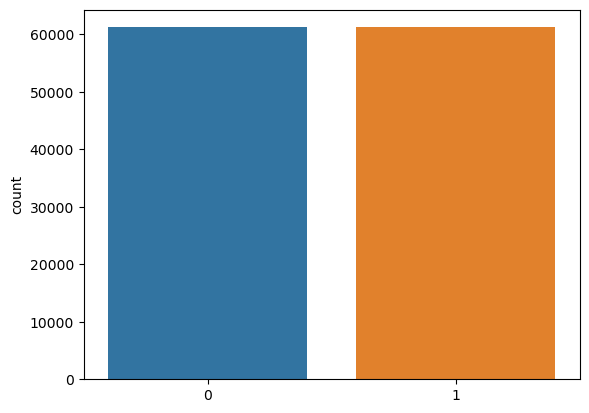

In [ ]:
sns.countplot(x=y_res)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res,y_res, test_size=0.30, random_state=42)

print(X_train.shape,X_test.shape)
print(y_train.shape,y_test.shape)

(85710, 24) (36734, 24)
(85710,) (36734,)


In [ ]:
logR = LogisticRegression(max_iter=1000)
# Build step forward feature selection
sfs1 = sfs(logR, k_features=15, forward=True, cv=15)
# Perform SFFS
sfs1 = sfs1.fit(X_train.values, y_train)

C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

In [ ]:
sfs2=sfs1.get_metric_dict()
sfs2 = pd.DataFrame.from_dict(sfs2)
sfs2

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
feature_idx,"(13,)","(8, 13)","(8, 13, 18)","(8, 13, 15, 18)","(3, 8, 13, 15, 18)","(3, 6, 8, 13, 15, 18)","(3, 6, 8, 13, 15, 18, 19)","(3, 6, 8, 13, 15, 18, 19, 20)","(3, 6, 8, 9, 13, 15, 18, 19, 20)","(3, 6, 8, 9, 13, 15, 17, 18, 19, 20)","(3, 6, 8, 9, 10, 13, 15, 17, 18, 19, 20)","(3, 4, 6, 8, 9, 10, 13, 15, 17, 18, 19, 20)","(3, 4, 6, 8, 9, 10, 12, 13, 15, 17, 18, 19, 20)","(3, 4, 6, 8, 9, 10, 11, 12, 13, 15, 17, 18, 19...","(3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 17, 18,..."
cv_scores,"[0.6330066503325166, 0.6363318165908295, 0.625...","[0.6648582429121456, 0.655932796639832, 0.6520...","[0.6695834791739587, 0.6608330416520826, 0.654...","[0.6706335316765838, 0.6610080504025201, 0.654...","[0.6718585929296464, 0.6590829541477073, 0.653...","[0.6676583829191459, 0.6622331116555827, 0.665...","[0.6685334266713335, 0.6620581029051452, 0.665...","[0.668008400420021, 0.6624081204060203, 0.6655...","[0.668358417920896, 0.6620581029051452, 0.6655...","[0.668008400420021, 0.6624081204060203, 0.6652...","[0.6676583829191459, 0.6610080504025201, 0.664...","[0.6681834091704585, 0.6618830941547077, 0.664...","[0.6650332516625831, 0.6571578578928946, 0.663...","[0.668708435421771, 0.6587329366468323, 0.6639...","[0.6704585229261463, 0.6624081204060203, 0.667..."
avg_score,0.625061,0.652771,0.655921,0.656773,0.656901,0.661323,0.661405,0.661393,0.661393,0.661241,0.660728,0.66018,0.65836,0.659468,0.66144
feature_names,"(13,)","(8, 13)","(8, 13, 18)","(8, 13, 15, 18)","(3, 8, 13, 15, 18)","(3, 6, 8, 13, 15, 18)","(3, 6, 8, 13, 15, 18, 19)","(3, 6, 8, 13, 15, 18, 19, 20)","(3, 6, 8, 9, 13, 15, 18, 19, 20)","(3, 6, 8, 9, 13, 15, 17, 18, 19, 20)","(3, 6, 8, 9, 10, 13, 15, 17, 18, 19, 20)","(3, 4, 6, 8, 9, 10, 13, 15, 17, 18, 19, 20)","(3, 4, 6, 8, 9, 10, 12, 13, 15, 17, 18, 19, 20)","(3, 4, 6, 8, 9, 10, 11, 12, 13, 15, 17, 18, 19...","(3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 17, 18,..."
ci_bound,0.003161,0.003066,0.00312,0.002999,0.003066,0.002114,0.002162,0.00213,0.002151,0.002045,0.00223,0.00227,0.002258,0.002539,0.00281
std_dev,0.005549,0.005383,0.005477,0.005264,0.005382,0.003711,0.003795,0.003739,0.003776,0.003589,0.003914,0.003984,0.003963,0.004456,0.004933
std_err,0.001483,0.001439,0.001464,0.001407,0.001438,0.000992,0.001014,0.000999,0.001009,0.000959,0.001046,0.001065,0.001059,0.001191,0.001318


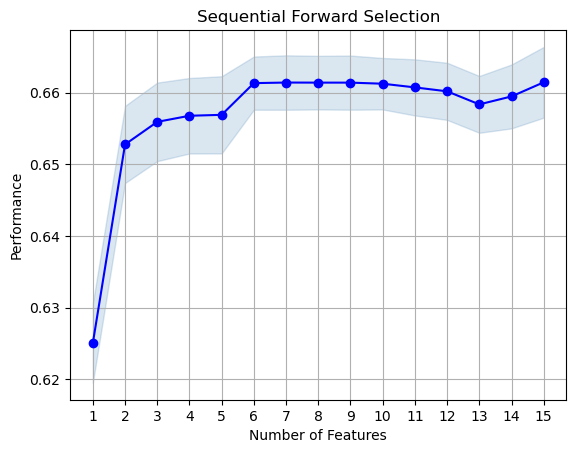

In [ ]:
fig = plot_sfs(sfs2)

plt.title('Sequential Forward Selection')
plt.grid()
plt.show()

In [ ]:
columnList = list(X)
feat_cols = list(sfs1.k_feature_idx_)
print(feat_cols)


[3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 17, 18, 19, 20]


In [ ]:
subsetColumnList = [columnList[i] for i in feat_cols]
print(subsetColumnList)

['Term', 'Interest Rate', 'Sub Grade', 'Employment Duration', 'Verification Status', 'Payment Plan', 'Debit to Income', 'Delinquency - two years', 'Total Accounts', 'Initial List Status', 'Total Received Late Fee', 'Collection Recovery Fee', 'Collection 12 months Medical', 'Last week Pay', 'Accounts Delinquent']


In [ ]:
logR1 = LogisticRegression(max_iter=1000)
logR1.fit(X_train[subsetColumnList], y_train)

LogisticRegression(max_iter=1000)

In [ ]:
y_train_pred = logR1.predict(X_train[subsetColumnList])
logR1.score(X_train[subsetColumnList], y_train)

0.6613230661533077

In [ ]:
y_test_pred = logR1.predict(X_test[subsetColumnList])
logR1.score(X_test[subsetColumnList], y_test)

0.656013502477269

In [ ]:
print(metrics.confusion_matrix(y_test, y_test_pred))
print(metrics.classification_report(y_test, y_test_pred))

[[11857  6625]
 [ 6011 12241]]
              precision    recall  f1-score   support

           0       0.66      0.64      0.65     18482
           1       0.65      0.67      0.66     18252

    accuracy                           0.66     36734
   macro avg       0.66      0.66      0.66     36734
weighted avg       0.66      0.66      0.66     36734



## Backward Selection

In [ ]:
logR2 = LogisticRegression(solver='lbfgs', max_iter=1000)
logreg_backward = sfs(logR2, k_features=15, forward=False, cv=15)
sfs_backward = logreg_backward.fit(X_train.values, y_train)


C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

In [ ]:
sfs_backward1= sfs_backward.get_metric_dict()

In [ ]:
sfs_backward1 = pd.DataFrame.from_dict(sfs_backward1)


In [ ]:
fig = plot_sfs(sfs_backward1)

plt.title('Backward Forward Selection')
plt.grid()
plt.show()

In [ ]:
feat_col_list = list(sfs_backward.k_feature_idx_)

In [ ]:
subsetColumnList1 = [columnList[i] for i in feat_col_list]
print(subsetColumnList1)

In [ ]:
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train[subsetColumnList1], y_train)
y_train_predict= logreg.predict(X_train[subsetColumnList1])
print(logreg.score(X_train[subsetColumnList], y_train))
print(logreg.score(X_test[subsetColumnList1], y_test))

In [ ]:
prediction=logreg.predict(X_test[subsetColumnList1].values)
print(metrics.confusion_matrix(y_test, prediction))
print(metrics.classification_report(y_test, prediction))

[[12096  6386]
 [ 6273 11979]]
              precision    recall  f1-score   support

           0       0.66      0.65      0.66     18482
           1       0.65      0.66      0.65     18252

    accuracy                           0.66     36734
   macro avg       0.66      0.66      0.66     36734
weighted avg       0.66      0.66      0.66     36734



C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


# 4. Model Building and evaluation

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.30, random_state=42)


In [ ]:
logistic_reg = LogisticRegression(max_iter=1000)
logistic_reg.fit(X_train,y_train)

LogisticRegression(max_iter=1000)

In [ ]:
logistic_reg.score(X_train, y_train)


0.9070811451804167

In [ ]:
logistic_reg.score(X_test,y_test)

0.9084440930876031

In [ ]:
prediction=logistic_reg.predict(X_test)
print(metrics.confusion_matrix(y_test, prediction))
print(metrics.classification_report(y_test, prediction))

[[18386     0]
 [ 1853     0]]
              precision    recall  f1-score   support

           0       0.91      1.00      0.95     18386
           1       0.00      0.00      0.00      1853

    accuracy                           0.91     20239
   macro avg       0.45      0.50      0.48     20239
weighted avg       0.83      0.91      0.86     20239



C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res,y_res, test_size=0.30, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



In [ ]:
# Define models
models = {
    'lr': LogisticRegression(),
    'dt': DecisionTreeClassifier(),
    'rf': RandomForestClassifier(),
    'Knn': KNeighborsClassifier()
}

In [ ]:
# Hyperparameter tuning using GridSearchCV
param_distributions = {
    'lr': {'C': uniform(0.1, 10)},
    'dt': {'max_depth': [None, 5, 10, 15], 'min_samples_split': randint(2, 11)},
    'rf': {'n_estimators': randint(50, 201), 'max_depth': [None, 5, 10, 15], 'min_samples_split': randint(2, 11)},
    'Knn': {'n_neighbors': [3, 5, 7]},
}

In [ ]:
best_models={}
best_models_random = {}

In [ ]:
for name, model in models.items():
    print(f"Training {name} with RandomizedSearchCV...")

    # Hyperparameter tuning with RandomizedSearchCV
    random_search = RandomizedSearchCV(model, param_distributions[name], n_iter=10, cv=5, scoring='accuracy', n_jobs=-1, random_state=42)
    random_search.fit(X_train, y_train)

    # Select best hyperparameters
    best_model_random = random_search.best_estimator_

    # Evaluate the model using cross-validation
    cv_scores_random = cross_val_score(best_model_random, X_train, y_train, cv=5, scoring='accuracy')

    # Print results
    print(f"Best hyperparameters: {random_search.best_params_}")
    print(f"Cross-validated accuracy: {cv_scores_random.mean():.4f}\n")

    # Save best model
    best_models_random[name] = best_model_random

# Select the best-performing model based on cross-validated accuracy
best_model_name_random = max(best_models_random, key=lambda k: cross_val_score(best_models_random[k], X_train, y_train, cv=5, scoring='accuracy').mean())
best_model_random = best_models_random[best_model_name_random]

# Evaluate the best model on the test set
test_accuracy_random = best_model_random.score(X_test, y_test)

# Print the final results for RandomizedSearchCV
print(f"Best-performing model (RandomizedSearchCV): {best_model_name_random}")
print(f"Test accuracy: {test_accuracy_random:.4f}")


Training lr with RandomizedSearchCV...
Best hyperparameters: {'C': 3.845401188473625}
Cross-validated accuracy: 0.6618

Training dt with RandomizedSearchCV...
Best hyperparameters: {'max_depth': None, 'min_samples_split': 3}
Cross-validated accuracy: 0.7313

Training rf with RandomizedSearchCV...
Best hyperparameters: {'max_depth': 15, 'min_samples_split': 7, 'n_estimators': 179}
Cross-validated accuracy: 0.7845

Training Knn with RandomizedSearchCV...


C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [       nan 0.77209194        nan]
  warnings.warn(
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Shailvi

Best hyperparameters: {'n_neighbors': 5}
Cross-validated accuracy: 0.7721



C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Shailvi\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `kee

Best-performing model (RandomizedSearchCV): rf
Test accuracy: 0.7874


Best model : Random Forest with accuracy of 78.74%, Best hyperparameters: {'max_depth': 15, 'min_samples_split': 7, 'n_estimators': 179}

# 5. Pipeline

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=7)

pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', LogisticRegression())
])

pipeline.fit(X_train,y_train)


Pipeline(steps=[('scaler', StandardScaler()), ('clf', LogisticRegression())])

In [ ]:
y_predict = pipeline.predict(X_test)
model_score = pipeline.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_predict))

0.6593074535852343
[[11810  6551]
 [ 5964 12409]]


Conclusion
1. There are 67463 rows and 35 features.
There are 9 float type columns, 17 integer type columns and 9 object type columns.
there are no missing values.
2. Target variable was highly imbalanced.
3. None of the feature seemed highly dependent on others.
4. Data in target variable was balanced by oversampling using SMOTE technique.
5. 'Term', 'Interest Rate', 'Sub Grade', 'Employment Duration', 'Verification Status', 'Payment Plan', 'Debit to Income', 'Delinquency - two years', 'Total Accounts', 'Initial List Status', 'Total Received Late Fee', 'Collection Recovery Fee', 'Collection 12 months Medical', 'Last week Pay', 'Accounts Delinquent' were the features selected in forward selection.
6. The model built by using these features gave 66 % accuracy in train set and 65% accuracy on test set.
7. Term', 'Interest Rate', 'Employment Duration', 'Verification Status', 'Payment Plan', 'Debit to Income', 'Delinquency - two years', 'Total Accounts', 'Initial List Status', 'Total Received Interest', 'Total Received Late Fee', 'Recoveries', 'Collection 12 months Medical', 'Last week Pay', 'Total Collection Amount were the features selected in backward selection.
7. The model built using these features gave an accuracy of
8. The base model gave an accuracy of 90% for both train and test set.
9. The best model while trying different models and tuning came out to be Random Forest with accuracy of 78.74%, Best hyperparameters: {'max_depth': 15, 'min_samples_split': 7, 'n_estimators': 179}
10. The base model's performance is much better than the tuned model.